# Phishing Detection using Supervised Learning

# Importing

In [71]:
## Importing tools
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sklearn
import pickle

%matplotlib inline

## model evaluation tools
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score,accuracy_score
from sklearn.metrics import roc_curve


## Importing Algoritms 
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

# Reading and exploring data

In [72]:
df=pd.read_csv("dataset_phishing.csv")
df.shape

(11430, 89)

In [73]:
df.head()

,url,length_url,length_hostname,ip,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,...,domain_in_title,domain_with_copyright,whois_registered_domain,domain_registration_length,domain_age,web_traffic,dns_record,google_index,page_rank,status
0,http://www.crestonwood.com/router.php,37,19,0,3,0,0,0,0,0,...,0,1,0,45,-1,0,1,1,4,legitimate
1,http://shadetreetechnology.com/V4/validation/a...,77,23,1,1,0,0,0,0,0,...,1,0,0,77,5767,0,0,1,2,phishing
2,https://support-appleld.com.secureupdate.duila...,126,50,1,4,1,0,1,2,0,...,1,0,0,14,4004,5828815,0,1,0,phishing
3,http://rgipt.ac.in,18,11,0,2,0,0,0,0,0,...,1,0,0,62,-1,107721,0,0,3,legitimate
4,http://www.iracing.com/tracks/gateway-motorspo...,55,15,0,2,2,0,0,0,0,...,0,1,0,224,8175,8725,0,0,6,legitimate


In [74]:
df=pd.DataFrame(df)
df.head()

,url,length_url,length_hostname,ip,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,...,domain_in_title,domain_with_copyright,whois_registered_domain,domain_registration_length,domain_age,web_traffic,dns_record,google_index,page_rank,status
0,http://www.crestonwood.com/router.php,37,19,0,3,0,0,0,0,0,...,0,1,0,45,-1,0,1,1,4,legitimate
1,http://shadetreetechnology.com/V4/validation/a...,77,23,1,1,0,0,0,0,0,...,1,0,0,77,5767,0,0,1,2,phishing
2,https://support-appleld.com.secureupdate.duila...,126,50,1,4,1,0,1,2,0,...,1,0,0,14,4004,5828815,0,1,0,phishing
3,http://rgipt.ac.in,18,11,0,2,0,0,0,0,0,...,1,0,0,62,-1,107721,0,0,3,legitimate
4,http://www.iracing.com/tracks/gateway-motorspo...,55,15,0,2,2,0,0,0,0,...,0,1,0,224,8175,8725,0,0,6,legitimate


In [75]:
print(df.dtypes) # all the data is int except status which needs to be converted into int format

url                object
length_url          int64
length_hostname     int64
ip                  int64
nb_dots             int64
                    ...  
web_traffic         int64
dns_record          int64
google_index        int64
page_rank           int64
status             object
Length: 89, dtype: object


In [76]:
df['status']

0        legitimate
1          phishing
2          phishing
3        legitimate
4        legitimate
            ...    
11425    legitimate
11426      phishing
11427    legitimate
11428    legitimate
11429      phishing
Name: status, Length: 11430, dtype: object

In [77]:
labels,uniques=pd.factorize(df['status'])

In [78]:
df['status']=labels

In [79]:
uniques

Index(['legitimate', 'phishing'], dtype='object')

In [80]:
df.head()

,url,length_url,length_hostname,ip,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,...,domain_in_title,domain_with_copyright,whois_registered_domain,domain_registration_length,domain_age,web_traffic,dns_record,google_index,page_rank,status
0,http://www.crestonwood.com/router.php,37,19,0,3,0,0,0,0,0,...,0,1,0,45,-1,0,1,1,4,0
1,http://shadetreetechnology.com/V4/validation/a...,77,23,1,1,0,0,0,0,0,...,1,0,0,77,5767,0,0,1,2,1
2,https://support-appleld.com.secureupdate.duila...,126,50,1,4,1,0,1,2,0,...,1,0,0,14,4004,5828815,0,1,0,1
3,http://rgipt.ac.in,18,11,0,2,0,0,0,0,0,...,1,0,0,62,-1,107721,0,0,3,0
4,http://www.iracing.com/tracks/gateway-motorspo...,55,15,0,2,2,0,0,0,0,...,0,1,0,224,8175,8725,0,0,6,0


In [81]:
df['status'].value_counts()

0    5715
1    5715
Name: status, dtype: int64

<Axes: >

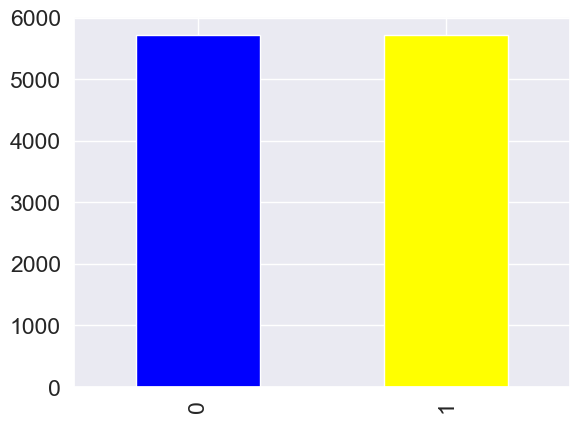

In [82]:
df["status"].value_counts().plot(kind="bar",color=["blue","yellow"])

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11430 entries, 0 to 11429
Data columns (total 89 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   url                         11430 non-null  object 
 1   length_url                  11430 non-null  int64  
 2   length_hostname             11430 non-null  int64  
 3   ip                          11430 non-null  int64  
 4   nb_dots                     11430 non-null  int64  
 5   nb_hyphens                  11430 non-null  int64  
 6   nb_at                       11430 non-null  int64  
 7   nb_qm                       11430 non-null  int64  
 8   nb_and                      11430 non-null  int64  
 9   nb_or                       11430 non-null  int64  
 10  nb_eq                       11430 non-null  int64  
 11  nb_underscore               11430 non-null  int64  
 12  nb_tilde                    11430 non-null  int64  
 13  nb_percent                  114

In [84]:
df.isna().sum()

url                0
length_url         0
length_hostname    0
ip                 0
nb_dots            0
                  ..
web_traffic        0
dns_record         0
google_index       0
page_rank          0
status             0
Length: 89, dtype: int64

In [85]:
## drop na code

In [86]:
df.describe() # to find the mean,median,std,min,max,etc.

,length_url,length_hostname,ip,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,nb_eq,...,domain_in_title,domain_with_copyright,whois_registered_domain,domain_registration_length,domain_age,web_traffic,dns_record,google_index,page_rank,status
count,11430.000000,11430.000000,11430.000000,11430.000000,11430.000000,11430.000000,11430.000000,11430.000000,11430.0,11430.000000,...,11430.000000,11430.000000,11430.000000,11430.000000,11430.000000,1.143000e+04,11430.000000,11430.000000,11430.000000,11430.000000
mean,61.126684,21.090289,0.150569,2.480752,0.997550,0.022222,0.141207,0.162292,0.0,0.293176,...,0.775853,0.439545,0.072878,492.532196,4062.543745,8.567566e+05,0.020122,0.533946,3.185739,0.500000
std,55.297318,10.777171,0.357644,1.369686,2.087087,0.155500,0.364456,0.821337,0.0,0.998317,...,0.417038,0.496353,0.259948,814.769415,3107.784600,1.995606e+06,0.140425,0.498868,2.536955,0.500022
min,12.000000,4.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,-1.000000,-12.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,33.000000,15.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,1.000000,0.000000,0.000000,84.000000,972.250000,0.000000e+00,0.000000,0.000000,1.000000,0.000000
50%,47.000000,19.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,1.000000,0.000000,0.000000,242.000000,3993.000000,1.651000e+03,0.000000,1.000000,3.000000,0.500000
75%,71.000000,24.000000,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,1.000000,1.000000,0.000000,449.000000,7026.750000,3.738455e+05,0.000000,1.000000,5.000000,1.000000
max,1641.000000,214.000000,1.000000,24.000000,43.000000,4.000000,3.000000,19.000000,0.0,19.000000,...,1.000000,1.000000,1.000000,29829.000000,12874.000000,1.076799e+07,1.000000,1.000000,10.000000,1.000000


In [87]:
pd.crosstab(df.status,df.ip)

ip,0,1
status,,
0,5512,203
1,4197,1518


In [88]:
pd.crosstab(df.status,df.domain_with_copyright)

domain_with_copyright,0,1
status,,
0,2712,3003
1,3694,2021


In [89]:
pd.crosstab(df.status,df.port)

port,0,1
status,,
0,5704,11
1,5699,16


In [90]:
pd.crosstab(df.status,df.nb_redirection)

nb_redirection,0,1,2,3,4,5,6
status,,,,,,,
0,3284,2002,362,54,9,4,0
1,3491,1825,300,74,22,2,1


In [91]:
pd.crosstab(df.status,df.google_index) # seems important

google_index,0,1
status,,
0,4748,967
1,579,5136


In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11430 entries, 0 to 11429
Data columns (total 89 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   url                         11430 non-null  object 
 1   length_url                  11430 non-null  int64  
 2   length_hostname             11430 non-null  int64  
 3   ip                          11430 non-null  int64  
 4   nb_dots                     11430 non-null  int64  
 5   nb_hyphens                  11430 non-null  int64  
 6   nb_at                       11430 non-null  int64  
 7   nb_qm                       11430 non-null  int64  
 8   nb_and                      11430 non-null  int64  
 9   nb_or                       11430 non-null  int64  
 10  nb_eq                       11430 non-null  int64  
 11  nb_underscore               11430 non-null  int64  
 12  nb_tilde                    11430 non-null  int64  
 13  nb_percent                  114

In [93]:
## add the plotting of the attributes selected by ayan and taniska
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(200,200))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

C:\Users\KIIT\AppData\Local\Temp\ipykernel_17968\1698413501.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrmat = df.corr()


[1.44153933e-02 1.42731054e-02 3.53265094e-02 1.70128507e-02
 1.37772966e-02 2.87460449e-03 1.26223022e-02 2.70539230e-03
 0.00000000e+00 6.68384346e-03 5.52288568e-03 5.88851754e-04
 1.47621561e-03 2.20655713e-02 2.99668049e-05 9.74988980e-04
 1.76170300e-04 9.50304866e-04 1.89605761e-05 1.38024999e-03
 8.06978108e-02 3.04303673e-03 3.43864958e-04 8.74342079e-04
 9.42276304e-03 2.22589608e-02 1.19378380e-02 3.14568345e-05
 1.51649831e-04 2.10671782e-03 1.02197785e-02 2.53784850e-03
 1.75992312e-02 1.67694501e-02 3.73118504e-03 8.77103234e-03
 1.29807395e-04 1.03751390e-02 2.71106768e-05 1.50510959e-02
 1.24080168e-02 1.30013415e-02 2.08430197e-02 1.21470776e-02
 1.15417107e-02 9.85185802e-03 1.59194454e-02 1.04872755e-02
 1.16990753e-02 1.31014065e-02 3.80088481e-02 1.35850129e-02
 4.28825851e-04 6.70365271e-04 3.84088199e-03 4.22949671e-03
 3.48014331e-02 3.83817154e-02 2.48160640e-02 0.00000000e+00
 7.12791944e-03 0.00000000e+00 1.62079969e-02 0.00000000e+00
 1.02820984e-02 3.892716

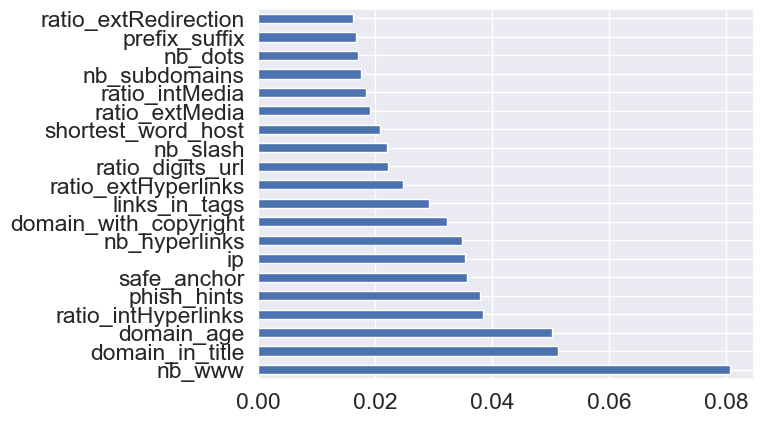

In [94]:
## This code is used to find the most important attributes for us

X = df.iloc[:,1:86]  #independent columns
y = df['status']    #target column i.e price range
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.show()

In [95]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

X = df.iloc[:,1:44]  #independent columns
y = df['status']    #target column i.e price range
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=40)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(20,'Score'))  #print 10 best features

                 Specs         Score
0           length_url  35328.039045
1      length_hostname   3574.909094
9                nb_eq   2116.254551
39    length_words_raw   2099.190649
42  shortest_word_host   1760.361475
7               nb_and   1381.779515
20              nb_www   1262.570425
2                   ip   1004.779198
6                nb_qm    931.273854
17       nb_semicolumn    704.022472
13            nb_slash    554.047400
4           nb_hyphens    500.135415
30    tld_in_subdomain    473.719023
33       prefix_suffix    420.136560
3              nb_dots    370.448986
21              nb_com    313.280246
5                nb_at    254.000000
25    ratio_digits_url    218.164314
26   ratio_digits_host    200.608193
31  abnormal_subdomain    183.680162


# First we will Scale the data for the complete data set

In [96]:
from sklearn import preprocessing

df = df.drop('url',axis=1)

min_max_scaler = preprocessing.MinMaxScaler()
new_data = min_max_scaler.fit_transform(df)

In [97]:
# converting the scalled data to pandas DataFrame

new_data=pd.DataFrame(new_data)
new_data

,0,1,2,3,4,5,6,7,8,9,...,78,79,80,81,82,83,84,85,86,87
0,0.015347,0.071429,0.0,0.086957,0.000000,0.00,0.000000,0.000000,0.0,0.000000,...,0.0,1.0,0.0,0.001542,0.000854,0.000000e+00,1.0,1.0,0.4,0.0
1,0.039902,0.090476,1.0,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,...,1.0,0.0,0.0,0.002615,0.448471,0.000000e+00,0.0,1.0,0.2,1.0
2,0.069982,0.219048,1.0,0.130435,0.023256,0.00,0.333333,0.105263,0.0,0.157895,...,1.0,0.0,0.0,0.000503,0.311656,5.413097e-01,0.0,1.0,0.0,1.0
3,0.003683,0.033333,0.0,0.043478,0.000000,0.00,0.000000,0.000000,0.0,0.000000,...,1.0,0.0,0.0,0.002112,0.000854,1.000382e-02,0.0,0.0,0.3,0.0
4,0.026397,0.052381,0.0,0.043478,0.046512,0.00,0.000000,0.000000,0.0,0.000000,...,0.0,1.0,0.0,0.007543,0.635341,8.102722e-04,0.0,0.0,0.6,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11425,0.020258,0.061905,0.0,0.043478,0.000000,0.00,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.015052,0.419680,3.696142e-04,0.0,0.0,0.6,0.0
11426,0.044199,0.066667,0.0,0.173913,0.000000,0.25,0.333333,0.000000,0.0,0.052632,...,1.0,0.0,0.0,0.007107,0.523048,0.000000e+00,0.0,1.0,0.0,1.0
11427,0.057090,0.057143,1.0,0.043478,0.139535,0.00,0.333333,0.000000,0.0,0.052632,...,0.0,0.0,0.0,0.094200,0.661726,7.429430e-07,0.0,1.0,1.0,0.0
11428,0.015961,0.123810,0.0,0.043478,0.000000,0.00,0.000000,0.000000,0.0,0.000000,...,1.0,0.0,0.0,0.002883,0.221015,2.280364e-01,0.0,0.0,0.4,0.0


In [98]:
# since the columns names were lost in scaling process so we restore that 

l=df.columns
j=0
for i in df.columns:
    new_data=new_data.rename(columns={j: i})
    j=j+1
    
new_data.head()

,length_url,length_hostname,ip,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,nb_eq,...,domain_in_title,domain_with_copyright,whois_registered_domain,domain_registration_length,domain_age,web_traffic,dns_record,google_index,page_rank,status
0,0.015347,0.071429,0.0,0.086957,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,1.0,0.0,0.001542,0.000854,0.000000,1.0,1.0,0.4,0.0
1,0.039902,0.090476,1.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,1.0,0.0,0.0,0.002615,0.448471,0.000000,0.0,1.0,0.2,1.0
2,0.069982,0.219048,1.0,0.130435,0.023256,0.0,0.333333,0.105263,0.0,0.157895,...,1.0,0.0,0.0,0.000503,0.311656,0.541310,0.0,1.0,0.0,1.0
3,0.003683,0.033333,0.0,0.043478,0.000000,0.0,0.000000,0.000000,0.0,0.000000,...,1.0,0.0,0.0,0.002112,0.000854,0.010004,0.0,0.0,0.3,0.0
4,0.026397,0.052381,0.0,0.043478,0.046512,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,1.0,0.0,0.007543,0.635341,0.000810,0.0,0.0,0.6,0.0


In [99]:
status=pd.DataFrame()
status=new_data['status']
new_data=new_data.drop('status',axis=1)

In [100]:
# using the scalled data to analyse and identify most important attributes

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

x = new_data.iloc[:,0:87]  #independent columns
y = status    #target column i.e status
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=5)
fit = bestfeatures.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(25,'Score'))  #print 20 best features

                    Specs        Score
85           google_index  2847.871702
2                      ip  1004.779198
20                 nb_www   631.285213
86              page_rank   603.251699
30       tld_in_subdomain   473.719023
77            empty_title   428.838710
33          prefix_suffix   420.136560
6                   nb_qm   310.424618
25       ratio_digits_url   301.381630
78        domain_in_title   301.077582
50            phish_hints   278.507742
26      ratio_digits_host   250.760241
82             domain_age   231.578842
55     statistical_report   217.441435
69         ratio_intMedia   213.149404
79  domain_with_copyright   191.943471
31     abnormal_subdomain   183.680162
84             dns_record   167.026087
57    ratio_intHyperlinks   160.054949
70         ratio_extMedia   142.879750
74            safe_anchor   141.547931
66       external_favicon   136.965572
54         suspecious_tld   136.043902
67          links_in_tags   128.912288
35     shortening_service

In [101]:
dt=pd.DataFrame()

dt['google_index']=x['google_index']
dt['ip']=x['ip']
dt["nb_www"]=x['nb_www']
dt['page_rank']=x['page_rank']
dt['tld_in_subdomain']=x['tld_in_subdomain']
dt['empty_title']=x['empty_title']
dt['prefix_suffix']=x['prefix_suffix']
dt['nb_qm']=x['nb_qm']
dt['ratio_digits_url']=x['ratio_digits_url']
dt['domain_in_title']=x['domain_in_title']
dt['phish_hints']=x['phish_hints']
dt['ratio_digits_host']=x['ratio_digits_host']
dt['domain_age']=x['domain_age']
dt['statistical_report']=x['statistical_report']
dt['ratio_intMedia']=x['ratio_intMedia']
dt['domain_with_copyright']=x['domain_with_copyright']

## if necesary add attributes as much needed

In [102]:
dt.shape,status.shape

((11430, 16), (11430,))

In [103]:
tempsv=dt
tempsv['status']=status
tempsv.to_csv('filename.csv', index = False, encoding='utf-8') 

# Initial Modelling

In [104]:
models = {
          "Logistic Regression":LogisticRegression(),
          "KNN":KNeighborsClassifier(),
          "Random Forest":RandomForestClassifier(),
          "AdaBoostClassifier":AdaBoostClassifier(),
          "Ridge":Ridge(),
          "Lasso":Lasso(),
          "ElasticNet":ElasticNet(),
          "DecisionTreeClassifier":DecisionTreeClassifier(),
          "GradientBoostingClassifier":GradientBoostingClassifier(),
          "ExtraTreesClassifier":ExtraTreesClassifier(),
          "SVC":SVC(),
          "SVR":SVR(),
          "GaussianNB":GaussianNB(),
          "GaussianProcessClassifier":GaussianProcessClassifier(),
          "MLPClassifier":MLPClassifier(),
          "LinearDiscriminantAnalysis":LinearDiscriminantAnalysis(),
          "QuadraticDiscriminantAnalysis":QuadraticDiscriminantAnalysis()
         }

# function to fit and score models 
def fit_and_score(models,X_train,X_test,y_train,y_test):
    np.random.seed(108)
    
    # Make a dictionary to keep model scores
    model_scores = {}
    # loop through models
    for name, model in models.items():
        
        # Fit the model to the data 
        model.fit(X_train,y_train)
        
        # saving the model
        pickle.dump(model,open("./Models/ "+name+".pkl","wb"))
        
        # Evaluate the model and append its score to model_scores
        model_scores[name] = model.score(X_test,y_test)
    return model_scores

In [105]:
# splitting the data
x = dt.drop('status',axis=1)
y = dt['status']
np.random.seed(108)

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3)

In [41]:
# finding the initial score for the model after fitting the models
model_scores = fit_and_score(models = models,
                             X_train = x_train,
                             X_test = x_test,
                             y_train = y_train,
                             y_test = y_test)
model_scores

C:\Users\KIIT\Desktop\Minor-Project\env\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.17788e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\KIIT\Desktop\Minor-Project\env\lib\site-packages\sklearn\discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


{'Logistic Regression': 0.794692330125401,
 'KNN': 0.8428113152522602,
 'Random Forest': 0.9658792650918635,
 'AdaBoostClassifier': 0.9477981918926801,
 'Ridge': 0.7317558198848393,
 'Lasso': 0.30471890073780317,
 'ElasticNet': 0.3349877703960227,
 'DecisionTreeClassifier': 0.9329250510352872,
 'GradientBoostingClassifier': 0.958296879556722,
 'ExtraTreesClassifier': 0.9650043744531933,
 'SVC': 0.6071741032370953,
 'SVR': -0.17078884773116498,
 'GaussianNB': 0.7454068241469817,
 'GaussianProcessClassifier': 0.805191017789443,
 'MLPClassifier': 0.8404782735491397,
 'LinearDiscriminantAnalysis': 0.9285505978419364,
 'QuadraticDiscriminantAnalysis': 0.6827063283756197}

In [106]:
# after analysis we choose the best 7 algorithms for further hypertuning
new_models={
          "Random Forest":RandomForestClassifier(),
          "ExtraTreesClassifier":ExtraTreesClassifier(),
          "GradientBoostingClassifier":GradientBoostingClassifier(),
          "AdaBoostClassifier":AdaBoostClassifier(),
          "DecisionTreeClassifier":DecisionTreeClassifier(),
          "MLPClassifier":MLPClassifier(),
          "Logistic Regression":LogisticRegression()
}

# HyperTuning Different Algorithms with there Specific Parameters 

## 1.Decision Tree Classifier 

In [ ]:
np.random.seed(108)

cf_grid={
    "criterion":["gini", "entropy", "log_loss"],
    "splitter":["best", "random"],
    "max_depth":[None,1,2,3,5,10],
    "min_samples_split":np.arange(0,50,10),
    "min_samples_split":np.arange(0,50,10),
    "min_samples_leaf":np.arange(1,50,5),
    "min_weight_fraction_leaf":np.arange(0,10,1)
}

grid = RandomizedSearchCV(DecisionTreeClassifier(),
                           param_distributions = cf_grid,
                           cv = 7,
                           verbose = True,
                           n_iter=100)
grid.fit(x_train,y_train)
pickle.dump(grid,open("DecisionTreeClassifier_HyperTuned.pkl","wb"))
print(grid.best_params_)
print(grid.best_score_)

## 2.MLP Classifier

In [ ]:
np.random.seed(108)

cf_grid={
    "hidden_layer_sizes":[100,200],
    "activation":["identity", "logistic", "tanh", "relu"],
    "solver":["lbfgs", "sgd", "adam"],
    "alpha":[0.0001,0.0005],
    "batch_size":np.arange(0,50,10),
    "learning_rate":["constant", "invscaling", "adaptive"],
    "power_t":np.arange(0,10,2)
}

grid = RandomizedSearchCV(MLPClassifier(),
                           param_distributions = cf_grid,
                           cv = 7,
                           verbose = True)
grid.fit(x_train,y_train)
pickle.dump(grid,open("MLPClassifier_HyperTuned.pkl","wb"))
print(grid.best_params_)
print(grid.best_score_)

## 3.LogisticRegression

In [ ]:
np.random.seed(108)

cf_grid={
    "penalty":['l1', 'l2', 'elasticnet', None],
    "dual":[True,False],
    "fit_intercept":[True,False],
    "intercept_scaling":np.arange(1,10,1),
    "class_weight":['dict','balanced'],
    "solver":['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
}

grid = RandomizedSearchCV(LogisticRegression(),
                           param_distributions = cf_grid,
                           cv = 7,
                           verbose = True)
grid.fit(x_train,y_train)
pickle.dump(grid,open("LogisticRegression_HyperTuned.pkl","wb"))
print(grid.best_params_)
print(grid.best_score_)

## 4.RandomForest Classifier

In [50]:
rf_grid = {"n_estimators":np.arange(10,300,50),
           "max_depth": [None,3,5,10,20,50,100],
           "min_samples_split":np.arange(2,30,2),
           "min_samples_leaf": np.arange(1,30,2)}


rs_rf = RandomizedSearchCV(RandomForestClassifier(),
                           param_distributions = rf_grid,
                           cv = 10,
                           n_iter = 15,
                           verbose = True)

rs_rf.fit(x_train,y_train)

pickle.dump(rs_rf,open("RandomForest_HyperTuned.pkl","wb"))

rs_rf.score(x_test,y_test)

Fitting 10 folds for each of 15 candidates, totalling 150 fits



KeyboardInterrupt



## 5.ExtraTrees Classifier

In [ ]:
etc_grid = {"n_estimators":np.arange(10,3000,50),
           "max_depth": [None,3,5,10,20,50,100],
           "min_samples_split":np.arange(2,30,2),
           "min_samples_leaf": np.arange(1,30,2),
           }

rs_etc = RandomizedSearchCV(ExtraTreesClassifier(),
                           param_distributions = etc_grid,
                           cv = 10,
                           n_iter = 15,
                           verbose = True)


rs_etc.fit(x_train,y_train)

pickle.dump(rs_etc,open("ExtraTreesClassifier_HyperTuned.pkl","wb"))

rs_etc.score(x_test,y_test)

## 6.Gradient Boosting Classifier

In [ ]:
GBC_grid = {"n_estimators":np.arange(10,300,50),
           "max_depth": [None,3,5,10,20,50,100],
           "min_samples_split":np.arange(2,30,2),
           "min_samples_leaf": np.arange(1,30,2),
           "random_state":np.arange(1,11,1),
           "learning_rate":[0.1,0.01,0.005]}

rs_GBC = RandomizedSearchCV(GradientBoostingClassifier(),
                           param_distributions = GBC_grid,
                           cv = 10,
                           n_iter = 15,
                           verbose = True)

rs_GBC.fit(x_train,y_train)
 
pickle.dump(rs_GBC,open("GradientBoostingClassifier_HyperTuned.pkl","wb"))

rs_GBC.score(x_test,y_test)

## 7.AdaBoost Classifier

In [ ]:
ABC_grid = {"n_estimators":np.arange(10,300,50),
           "random_state":np.arange(1,11,1),
           "learning_rate":[0.1,0.01,0.005]}

rs_ABC = RandomizedSearchCV(AdaBoostClassifier(),
                           param_distributions = ABC_grid,
                           cv = 10,
                           n_iter = 15,
                           verbose = True)

rs_ABC.fit(x_train,y_train)

pickle.dump(rs_ABC,open("AdaBoostClassifier_HyperTuned.pkl","wb"))

rs_ABC.score(x_test,y_test)

# Metrics Analysis of the Algorithms

In [116]:
# return the metric precision,accuracy,recall & f1_score of the model
def metric_analysis(model):
    y_preds=model.predict(x_test)
    
    precision=precision_score(y_test,y_preds)
    accuracy=accuracy_score(y_test,y_preds)
    recall=recall_score(y_test,y_preds)
    f1score=f1_score(y_test,y_preds)
    
    result={
        "precision":precision,
        "accuracy":accuracy,
        "recall":recall,
        "f1score":f1score
    }
    
    return result

In [117]:
# plots the Confusion Matrix TT,TF,FT & FF
sns.set(font_scale = 1.5)
def plot_conf_matrix(model):
    y_preds=model.predict(x_test)
    fig,ax  = plt.subplots(figsize=(3,3))
    ax = sns.heatmap(confusion_matrix(y_test,y_preds),
                    annot = True,
                    cbar = False)
    plt.xlabel("True Label")
    plt.ylabel("Predicted Label")

In [118]:
# Visualize cross-validated metrics
def cross_validated(model):
    result=metric_analysis(model)
    cv_metrics = pd.DataFrame({"Accuracy":result['accuracy'],
                           "Precision":result['precision'],
                           "Recall":result['recall'],
                           "F1":result['f1score']},
                         index = [0])
    cv_metrics.T.plot.bar(title="Cross-validated classification metrics")

In [119]:
# prints the classification report consisting of macro average and weighted average and accuracy
def classification_report_print(model):
    y_preds=model.predict(x_test)
    print(classification_report(y_test,y_preds))

In [120]:
# Plots the ROC(receiver operating characteristic curve) of the model 
def plot_roc_curve(model):
    y_probs=model.predict_proba(x_test)
    
    y_probs_positive=y_probs[:,1]
    fpr,tpr,thresholds=roc_curve(y_test,y_probs_positive)
    
    plt.plot(fpr,tpr,color="orange",label="ROC")
    ##Customize the plot
    plt.xlabel("False positive rate(fpr)")
    plt.ylabel("True positive rate(tpr)")
    plt.title("Receiver Operating Characterstic (ROC) Curve")
    plt.legend()
    plt.show()

In [142]:
# runs various metrics functions for a particular model
def metrics(model):
    plot_roc_curve(model)
    plot_conf_matrix(model)
    cross_validated(model)
    classification_report_print(model)

## Analyzing Models By Calling Metric Function()

              precision    recall  f1-score   support

         0.0       0.90      0.43      0.58      1695
         1.0       0.63      0.96      0.76      1734

    accuracy                           0.69      3429
   macro avg       0.77      0.69      0.67      3429
weighted avg       0.77      0.69      0.67      3429



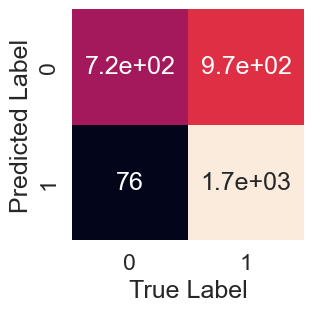

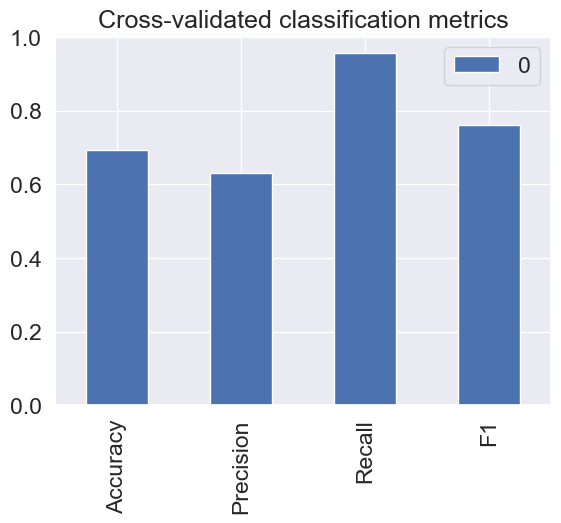

In [156]:
dtc=pickle.load(open("./hyper/DecisionTreeClassifier_HyperTuned.pkl","rb"))
metrics(dtc)

              precision    recall  f1-score   support

         0.0       0.98      0.50      0.66      1695
         1.0       0.67      0.99      0.80      1734

    accuracy                           0.75      3429
   macro avg       0.82      0.75      0.73      3429
weighted avg       0.82      0.75      0.73      3429



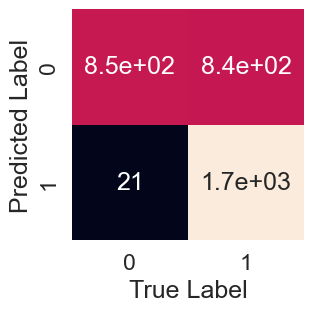

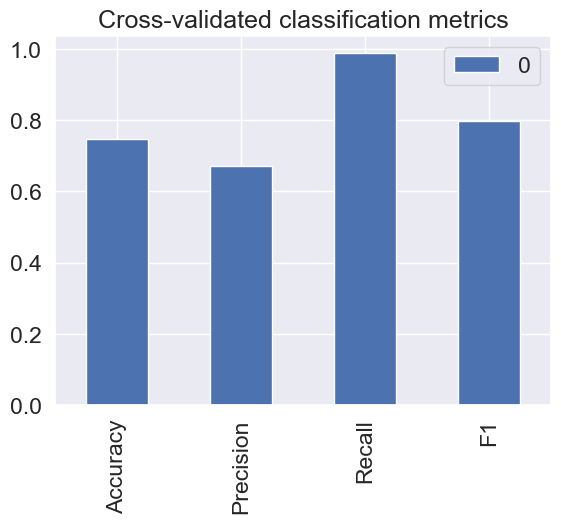

In [158]:
mlp=pickle.load(open("./hyper/MLPClassifier_HyperTuned.pkl","rb"))
metrics(mlp)

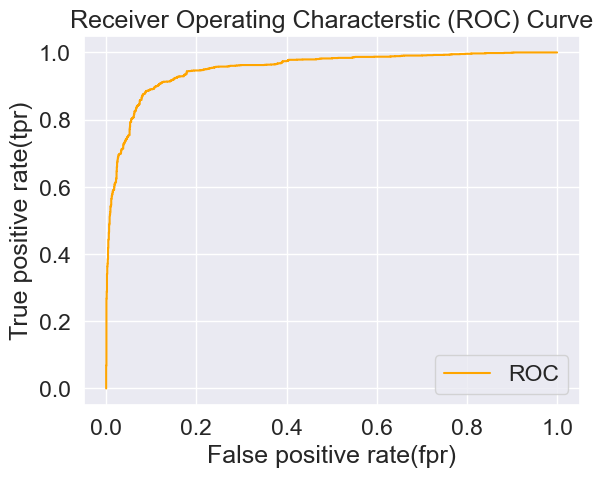

              precision    recall  f1-score   support

         0.0       0.97      0.45      0.62      1695
         1.0       0.65      0.99      0.78      1734

    accuracy                           0.72      3429
   macro avg       0.81      0.72      0.70      3429
weighted avg       0.81      0.72      0.70      3429



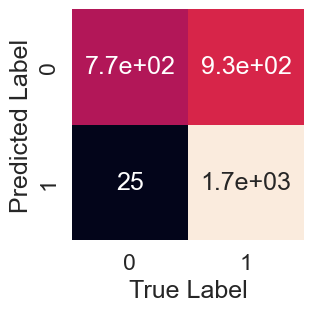

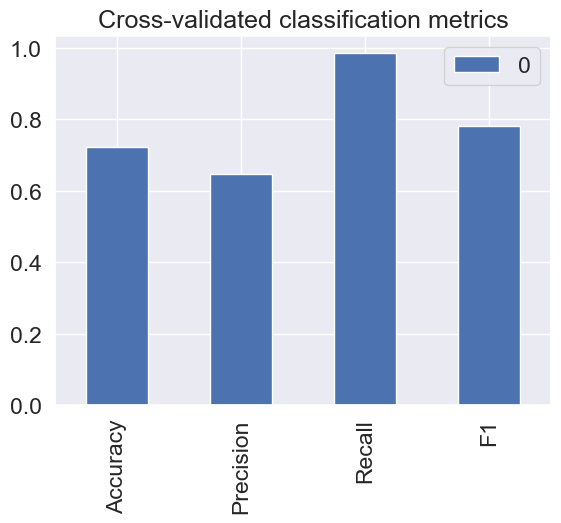

In [137]:
lr=pickle.load(open("./hyper/LogisticRegression_HyperTuned.pkl","rb"))
metrics(lr)

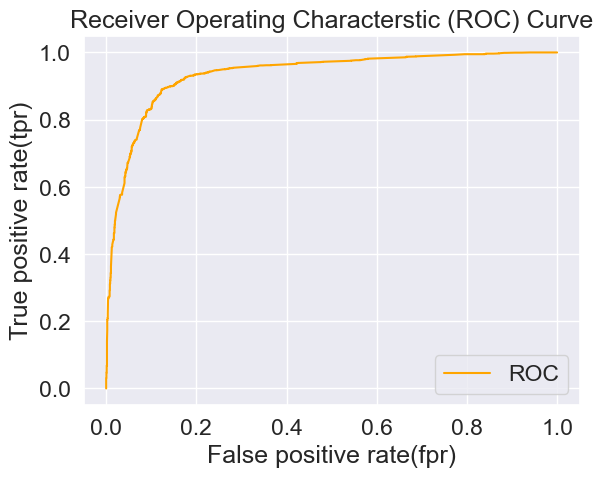

              precision    recall  f1-score   support

         0.0       0.97      0.20      0.34      1695
         1.0       0.56      0.99      0.72      1734

    accuracy                           0.60      3429
   macro avg       0.77      0.60      0.53      3429
weighted avg       0.77      0.60      0.53      3429



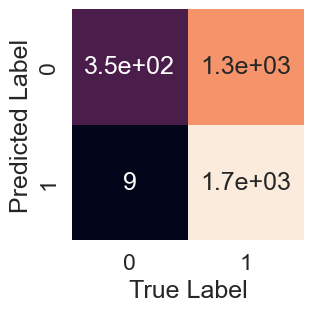

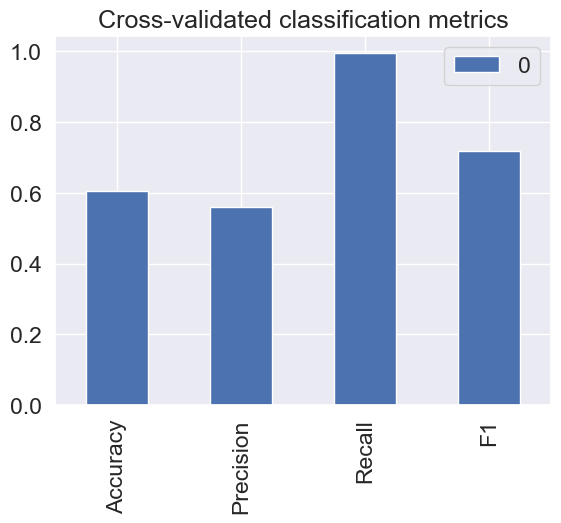

In [138]:
rf=pickle.load(open("./hyper/RandomForest_Hypertuned.pkl","rb"))
metrics(rf)

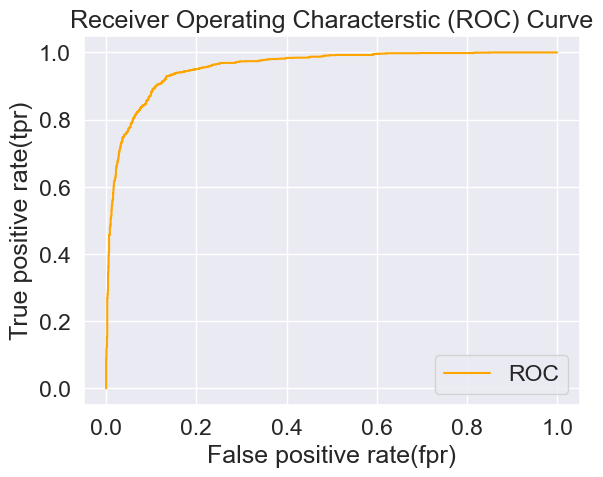

              precision    recall  f1-score   support

         0.0       0.97      0.62      0.76      1695
         1.0       0.73      0.98      0.83      1734

    accuracy                           0.80      3429
   macro avg       0.85      0.80      0.79      3429
weighted avg       0.85      0.80      0.80      3429



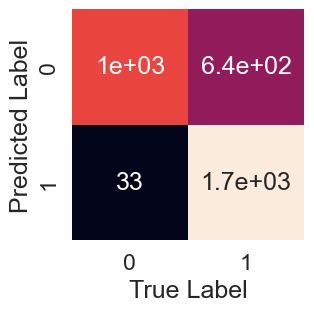

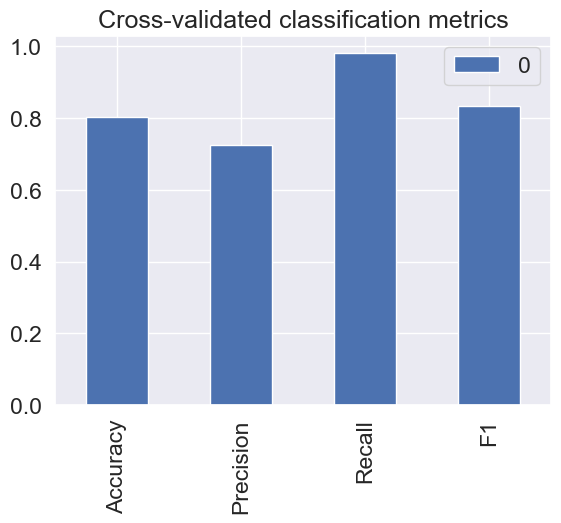

In [126]:
rf=pickle.load(open("./hyper/ExtraTreesClassifier_Hypertuned.pkl","rb"))
metrics(rf)

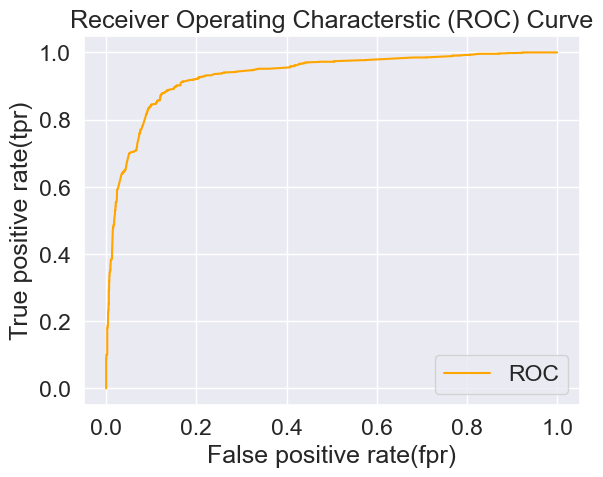

              precision    recall  f1-score   support

         0.0       0.95      0.53      0.68      1695
         1.0       0.68      0.97      0.80      1734

    accuracy                           0.75      3429
   macro avg       0.81      0.75      0.74      3429
weighted avg       0.81      0.75      0.74      3429



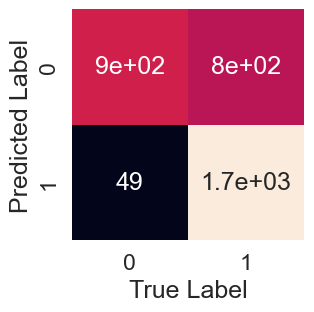

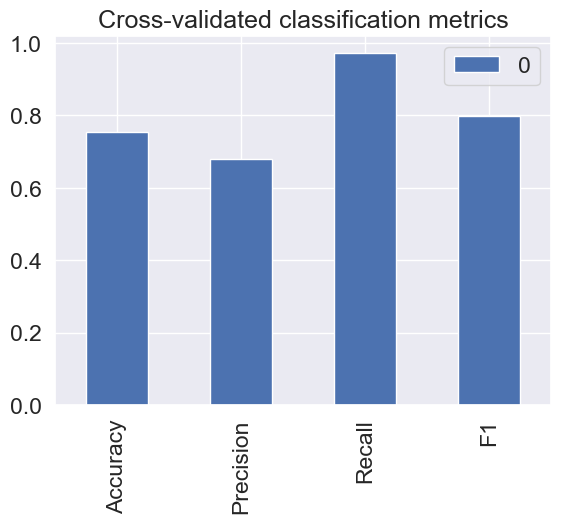

In [139]:
gbc=pickle.load(open("./hyper/GradientBoostingClassifier_Hypertuned.pkl","rb"))
metrics(gbc)

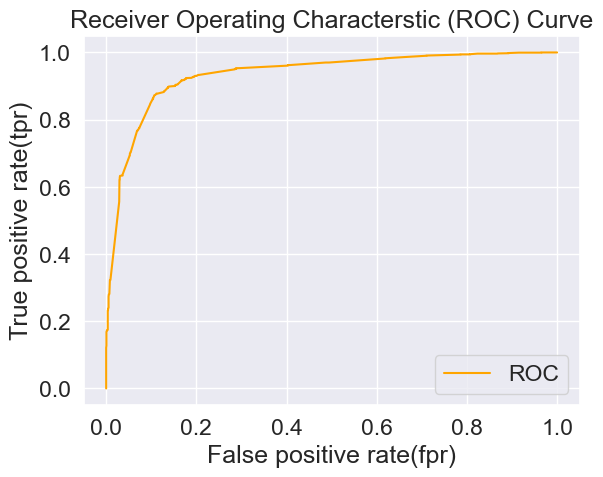

              precision    recall  f1-score   support

         0.0       0.97      0.21      0.35      1695
         1.0       0.56      0.99      0.72      1734

    accuracy                           0.61      3429
   macro avg       0.77      0.60      0.54      3429
weighted avg       0.76      0.61      0.54      3429



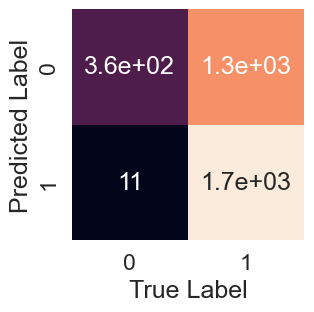

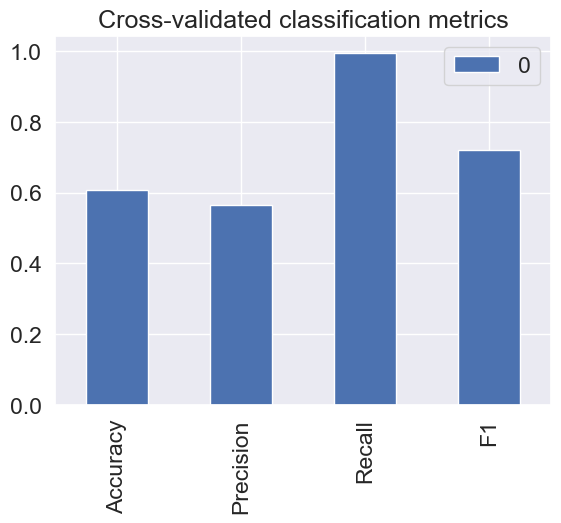

In [140]:
ada=pickle.load(open("./hyper/AdaBoostClassifier_Hypertuned.pkl","rb"))
metrics(ada)

In [ ]:
## In conclusion we get to know that gridient boosting and random forest classifier algorithms give the best accuracy in 
## terms of the selected parameters and after our own customized dataset using data engineering !!